<a href="https://colab.research.google.com/gist/sabdha/4a61d20906d3835cfbc1d2b05116f18d/tf_densenet_robust_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

!pip install split-folders
import splitfolders
Data = '/content/drive/MyDrive/Solar_Training'
splitfolders.ratio(Data, output="img", seed=42,ratio=(0.80, 0.20))


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Copying files: 1760 files [00:34, 51.18 files/s] 


In [ ]:

import os

import numpy as np

import shutil

rootdir= '/content/drive/MyDrive/Detect solar dust_Task-1-Data Collection /Standard Data-Set' #path of the original folder

classes = ['CleanPV','DirtyPV']

for i in classes:
  os.makedirs(rootdir +'/train/' + i)

  os.makedirs(rootdir +'/val/' + i)
  
  source = rootdir + '/' + i
  
  allFileNames = os.listdir(source)

  np.random.shuffle(allFileNames)

  val_ratio = 0.20

  train_FileNames, val_FileNames = np.split(np.array(allFileNames),
                                                        [int(len(allFileNames)* (1 - val_ratio))])

  train_FileNames = [source+'/'+ name for name in train_FileNames.tolist()]
  val_FileNames = [source+'/' + name for name in val_FileNames.tolist()]

  for name in train_FileNames:
    shutil.copy(name, rootdir +'/train/' + i)

  for name in val_FileNames:
    shutil.copy(name, rootdir +'/val/' + i)

In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Dropout, Flatten, Dense, GlobalAveragePooling2D, Input
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras import optimizers
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt
import math
import os
import os.path
import time

# utility functions
def graph_training_history(history, save_fig=False, save_path=None):
    plt.rcParams["figure.figsize"] = (12, 9)

    plt.style.use('ggplot')

    plt.figure(1)

    # summarize history for accuracy

    plt.subplot(211)
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc='lower right')

    # summarize history for loss

    plt.subplot(212)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc='upper right')

    plt.tight_layout()

    if save_fig:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
    else:
        plt.show()
    
    # clear and close the current figure
    plt.clf()
    plt.close()

# util function to calculate the class weights based on the number of samples on each class
# this is useful with datasets that are highly skewed (datasets where 
# the number of samples in each class differs vastly)
def get_class_weights(class_data_dir):
    labels_count = dict()
    for img_class in [ic for ic in os.listdir(class_data_dir) if ic[0] != '.']:
        labels_count[img_class] = len(os.listdir(os.path.join(class_data_dir, img_class)))
    total_count = sum(labels_count.values())
    class_weights = {cls: total_count / count for cls, count in 
                    enumerate(labels_count.values())}
    return class_weights

# util function to get the initial epoch number from the checkpoint name
def get_init_epoch(checkpoint_path):
    filename = os.path.basename(checkpoint_path)
    filename = os.path.splitext(filename)[0]
    init_epoch = filename.split("-")[1]
    return int(init_epoch)

run_training = True
run_finetune = True

class_indices_path = 'class_indices.npy'
initial_model_path = 'solar_classify_finetune_initial.h5'
final_model_path = 'solar_classify_finetune_final.h5'

# check which of the training steps still need to complete
# if saved model file is already there, then that step is considered complete
if os.path.isfile(initial_model_path):
    run_training = False
    print("[Info] Initial model exists '{}'. Skipping training step.".format(initial_model_path))

if os.path.isfile(final_model_path):
    run_finetune = False
    print("[Info] Fine-tuned model exists '{}'. Skipping fine-tuning step.".format(final_model_path))

load_from_checkpoint_train = False

training_checkpoint_dir = '/content/drive/MyDrive/checkpoints/training'
if run_training and len(os.listdir(training_checkpoint_dir)) > 0:
    # the checkpoint to load and continue from
    training_checkpoint = os.path.join(training_checkpoint_dir, os.listdir(training_checkpoint_dir)[len(os.listdir(training_checkpoint_dir))-1])
    load_from_checkpoint_train = True

init_epoch_train = 0
if load_from_checkpoint_train:
    # get the epoch number to continue from
    print(training_checkpoint)
    init_epoch_train = get_init_epoch(training_checkpoint)
    print("[Info] Training checkpoint found for epoch {}. Will continue from that step.".format(init_epoch_train))


load_from_checkpoint_finetune = False

finetune_checkpoint_dir = '/content/drive/MyDrive/checkpoints/finetune'
if run_finetune and len(os.listdir(finetune_checkpoint_dir)) > 0:
    # the checkpoint to load and continue from
    finetune_checkpoint = os.path.join(finetune_checkpoint_dir, os.listdir(finetune_checkpoint_dir)[len(os.listdir(finetune_checkpoint_dir))-1])
    load_from_checkpoint_finetune = True

init_epoch_finetune = 0
if load_from_checkpoint_finetune:
    # get the epoch number to continue from
    init_epoch_finetune = get_init_epoch(finetune_checkpoint)
    print("[Info] Training checkpoint found for epoch {}. Will continue from that step.".format(init_epoch_finetune))


# start time of the script
start_time = time.time()

# dimensions of our images.
img_width, img_height = 224, 224

train_data_dir = '/content/img/train'
validation_data_dir = '/content/img/val'

# number of epochs to train
epochs = 50

# batch size used by flow_from_directory
batch_size = 16


# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

# the number of classes/categories
num_classes = len(train_generator.class_indices)

# save the class indices for use in the predictions
np.save(class_indices_path, train_generator.class_indices)

# calculate the training steps
nb_train_samples = len(train_generator.filenames)
train_steps = int(math.ceil(nb_train_samples / batch_size))

# calculate the validation steps
nb_validation_samples = len(validation_generator.filenames)
validation_steps = int(math.ceil(nb_validation_samples / batch_size))

# get the class weights
class_weights = get_class_weights(train_data_dir)

if run_training:
    if load_from_checkpoint_train:
        model = load_model(training_checkpoint)
    else:
        # create the base pre-trained model
        base_model = DenseNet121(
            weights='imagenet', 
            include_top=False, 
            input_tensor=Input(shape=(img_width, img_height, 3))
            )

        # add a global spatial average pooling layer
        x = base_model.output
        x = GlobalAveragePooling2D()(x)
        x = Dense(512, activation='relu')(x)
        predictions = Dense(num_classes, activation='softmax')(x)

        # this is the model we will train
        model = Model(inputs=base_model.input, outputs=predictions)

        # first: train only the top layers (which were randomly initialized)
        # i.e. freeze all convolutional layers
        for layer in base_model.layers:
            layer.trainable = False

        # compile the model (should be done *after* setting layers to non-trainable)
        model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['acc'])

    filepath = training_checkpoint_dir + "/model-{epoch:02d}-{val_acc:.2f}-{val_loss:.2f}.h5"
    checkpoint = ModelCheckpoint(
                                filepath, 
                                monitor="val_acc", 
                                verbose=1, 
                                save_best_only=True, 
                                save_weights_only=False, 
                                mode="max"
                                )

    early_stop = EarlyStopping(
                                monitor="val_acc", 
                                mode="max", 
                                verbose=1, 
                                patience=5, 
                                restore_best_weights=True
                                )

    callbacks_list = [checkpoint, early_stop]

    history = model.fit(
                        train_generator,
                        steps_per_epoch=train_steps,
                        epochs=epochs,
                        validation_data=validation_generator,
                        validation_steps=validation_steps,
                        class_weight=class_weights,
                        max_queue_size=15,
                        workers=8,
                        initial_epoch=init_epoch_train,
                        callbacks=callbacks_list
                        )

    model.save(initial_model_path)

    (eval_loss, eval_accuracy) = model.evaluate(
        validation_generator, steps=validation_steps)

    print("\n")

    print("[INFO] accuracy: {:.2f}%".format(eval_accuracy * 100))
    print("[INFO] Loss: {}".format(eval_loss))

    graph_training_history(history, save_fig=True, save_path='training.png')

else:
    # training step is already completed
    # load the already trained model
    model = load_model(initial_model_path)


# Run Fine-tuning on our model
if run_finetune:
    # number of epochs to fine-tune
    ft_epochs = 25

    # reset our data generators
    train_generator.reset()
    validation_generator.reset()



    if load_from_checkpoint_finetune:
        model = load_model(finetune_checkpoint)
    else:
      
        # we chose to train the last convolution block from the base model
        
        for layer in model.layers[:249]:
            layer.trainable = False
        for layer in model.layers[249:]:
            layer.trainable = True

        # we need to recompile the model for these modifications to take effect
        # we use SGD with a low learning rate
        model.compile(
            optimizer=optimizers.SGD(lr=0.0001, momentum=0.9), 
            loss='categorical_crossentropy', 
            metrics=['acc']
            )

    filepath = finetune_checkpoint_dir + "/model-{epoch:02d}-{val_acc:.2f}-{val_loss:.2f}.h5"
    checkpoint = ModelCheckpoint(
                                filepath, 
                                monitor="val_acc", 
                                verbose=1, 
                                save_best_only=True, 
                                save_weights_only=False, 
                                mode="max"
                                )

    early_stop = EarlyStopping(
                                monitor="val_acc", 
                                mode="max", 
                                verbose=1, 
                                patience=5, 
                                restore_best_weights=True
                                )

    callbacks_list = [checkpoint, early_stop]
    
    history = model.fit(
                        train_generator,
                        steps_per_epoch=train_steps,
                        epochs=ft_epochs,
                        validation_data=validation_generator,
                        validation_steps=validation_steps,
                        class_weight=class_weights,
                        max_queue_size=15,
                        workers=8,
                        initial_epoch=init_epoch_finetune,
                        callbacks=callbacks_list
                        )

    model.save(final_model_path)

    (eval_loss, eval_accuracy) = model.evaluate(
        validation_generator, steps=validation_steps)

    print("\n")

    print("[INFO] accuracy: {:.2f}%".format(eval_accuracy * 100))
    print("[INFO] Loss: {}".format(eval_loss))

    graph_training_history(history, save_fig=True, save_path='finetune.png')

    end_time = time.time()

    training_duration = end_time - start_time
    print("[INFO] Total Time for training: {} seconds".format(training_duration))

Found 1408 images belonging to 2 classes.
Found 352 images belonging to 2 classes.
29097984/29084464 [==============================] - 0s 0us/step
Epoch 1/50
88/88 [==============================] - ETA: 0s - loss: 1.4984 - acc: 0.7116

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Epoch 1: val_acc improved from -inf to 0.82102, saving model to /content/drive/MyDrive/checkpoints/training/model-01-0.82-0.39.h5
88/88 [==============================] - 67s 512ms/step - loss: 1.4984 - acc: 0.7116 - val_loss: 0.3944 - val_acc: 0.8210
Epoch 2/50
88/88 [==============================] - ETA: 0s - loss: 0.8821 - acc: 0.7926
Epoch 2: val_acc did not improve from 0.82102
88/88 [==============================] - 48s 516ms/step - loss: 0.8821 - acc: 0.7926 - val_loss: 0.5214 - val_acc: 0.7443
Epoch 3/50
88/88 [==============================] - ETA: 0s - loss: 0.7937 - acc: 0.7997
Epoch 3: val_acc improved from 0.82102 to 0.84943, saving model to /content/drive/MyDrive/checkpoints/training/model-03-0.85-0.33.h5
88/88 [==============================] - 47s 507ms/step - loss: 0.7937 - acc: 0.7997 - val_loss: 0.3282 - val_acc: 0.8494
Epoch 4/50
88/88 [==============================] - ETA: 0s - loss: 0.7155 - acc: 0.8324
Epoch 4: val_acc did not improve from 0.84943
88/88 [====

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


Epoch 1/25
88/88 [==============================] - ETA: 0s - loss: 0.9547 - acc: 0.8182

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))



Epoch 1: val_acc improved from -inf to 0.87500, saving model to /content/drive/MyDrive/checkpoints/finetune/model-01-0.88-0.33.h5
88/88 [==============================] - 62s 534ms/step - loss: 0.9547 - acc: 0.8182 - val_loss: 0.3342 - val_acc: 0.8750
Epoch 2/25
88/88 [==============================] - ETA: 0s - loss: 0.4915 - acc: 0.8885
Epoch 2: val_acc did not improve from 0.87500
88/88 [==============================] - 51s 523ms/step - loss: 0.4915 - acc: 0.8885 - val_loss: 0.3431 - val_acc: 0.8608
Epoch 3/25
88/88 [==============================] - ETA: 0s - loss: 0.4696 - acc: 0.9055
Epoch 3: val_acc improved from 0.87500 to 0.88068, saving model to /content/drive/MyDrive/checkpoints/finetune/model-03-0.88-0.32.h5
88/88 [==============================] - 50s 542ms/step - loss: 0.4696 - acc: 0.9055 - val_loss: 0.3200 - val_acc: 0.8807
Epoch 4/25
88/88 [==============================] - ETA: 0s - loss: 0.4491 - acc: 0.9041
Epoch 4: val_acc did not improve from 0.88068
88/88 [====

[Info] Predicted: DirtyPV, Confidence: 91.46544%


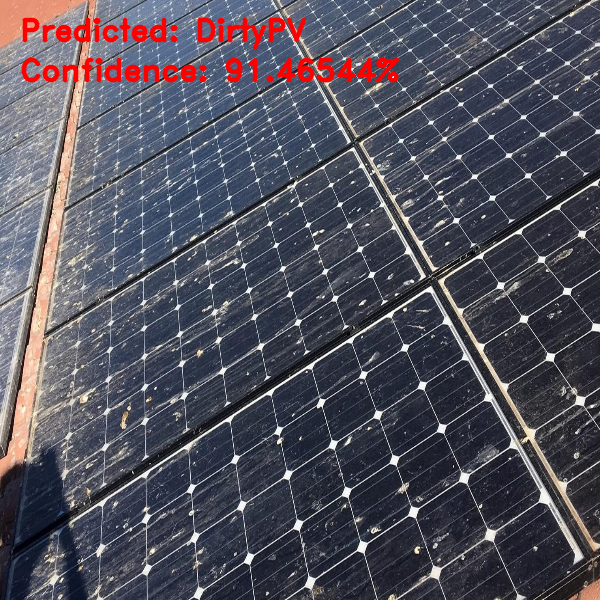

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import to_categorical
import cv2
from google.colab.patches import cv2_imshow
image_path = '/content/drive/MyDrive/TestSet/DirtyPV/DirtyPV-TEST-(1).jpg'
img_width, img_height = 224, 224

# load the trained model
model = load_model('/content/solar_classify_finetune_final.h5')

# load the class label dictionary
class_dictionary = np.load('/content/class_indices.npy', allow_pickle=True).item()

# load the image and resize it to the size required by our model
image_orig = load_img(image_path, target_size=(img_width, img_height), interpolation='lanczos')
image = img_to_array(image_orig)

# important! otherwise the predictions will be '0'
image = image / 255.0

# add a new axis to make the image array confirm with
# the (samples, height, width, depth) structure
image = np.expand_dims(image, axis=0)

# get the probabilities for the prediction
probabilities = model.predict(image)

# decode the prediction
prediction_probability = probabilities[0, probabilities.argmax(axis=1)][0]
class_predicted = np.argmax(probabilities, axis=1)
inID = class_predicted[0]

# invert the class dictionary in order to get the label for the id
inv_map = {v: k for k, v in class_dictionary.items()}
label = inv_map[inID]

print("[Info] Predicted: {}, Confidence: {:.5f}%".format(label, prediction_probability*100))

# display the image and the prediction using OpenCV
image_cv = cv2.imread(image_path)
image_cv = cv2.resize(image_cv, (600, 600), interpolation=cv2.INTER_LINEAR)

cv2.putText(image_cv, 
            "Predicted: {}".format(label), 
            (20, 40), cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)
cv2.putText(image_cv, 
            "Confidence: {:.5f}%".format(prediction_probability*100), 
            (20, 80), cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)

#cv2.imshow("Prediction", image_cv)
cv2_imshow(image_cv)
#cv2.waitKey(0)

#cv2.destroyAllWindows()

In [ ]:
img ='/content/drive/MyDrive/DirtyAndClean-Test-2/CleanPV-TEST-(1).jpg'
gt_class_name = (img.split('-')[2].split('/')[1])
print(gt_class_name)

CleanPV


[Info] Predicted: CleanPV, Confidence: 72.25442%


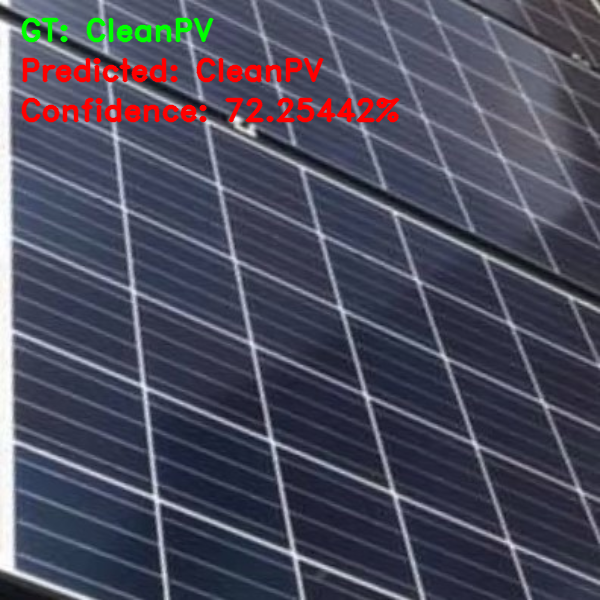

[Info] Predicted: CleanPV, Confidence: 97.16455%


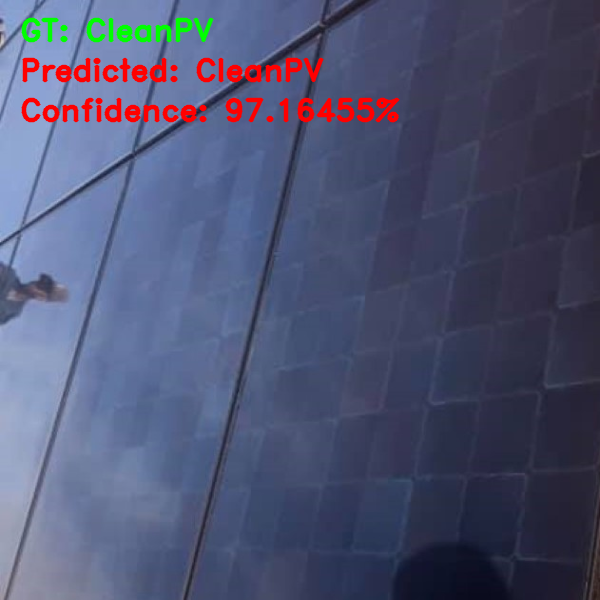

[Info] Predicted: DirtyPV, Confidence: 86.32436%


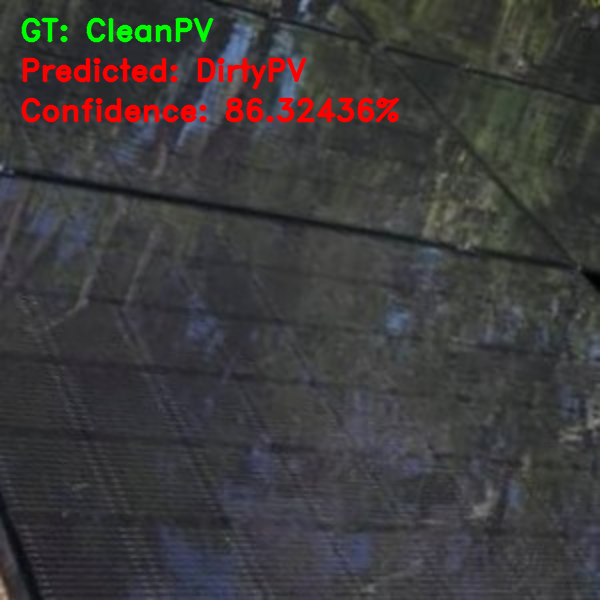

[Info] Predicted: CleanPV, Confidence: 99.70365%


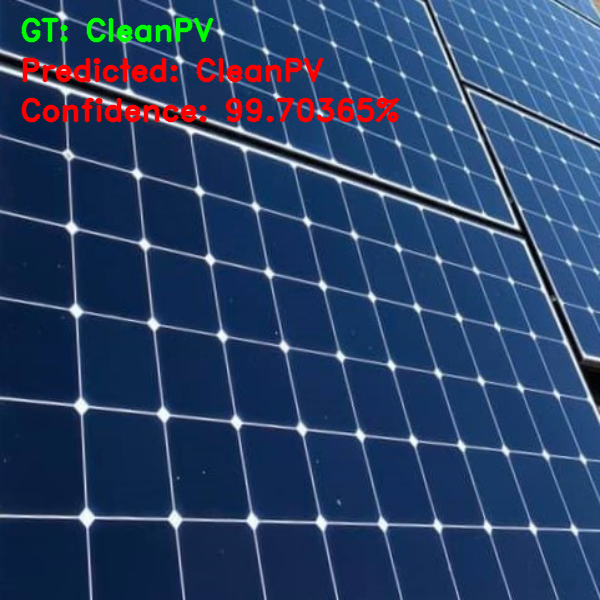

[Info] Predicted: DirtyPV, Confidence: 99.51173%


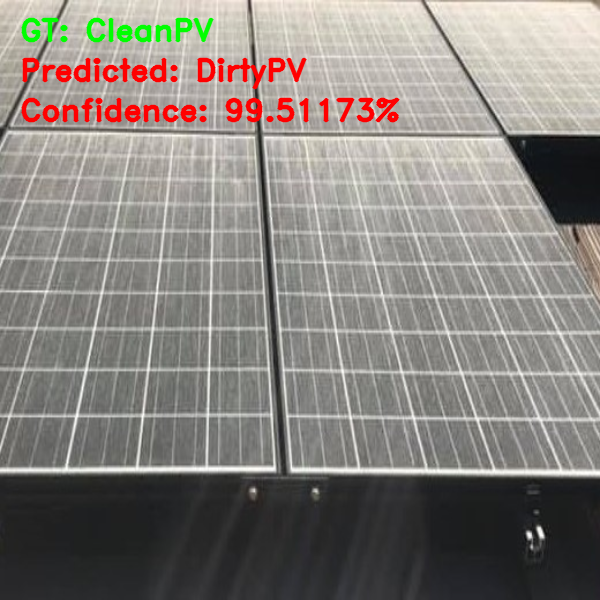

[Info] Predicted: CleanPV, Confidence: 96.67277%


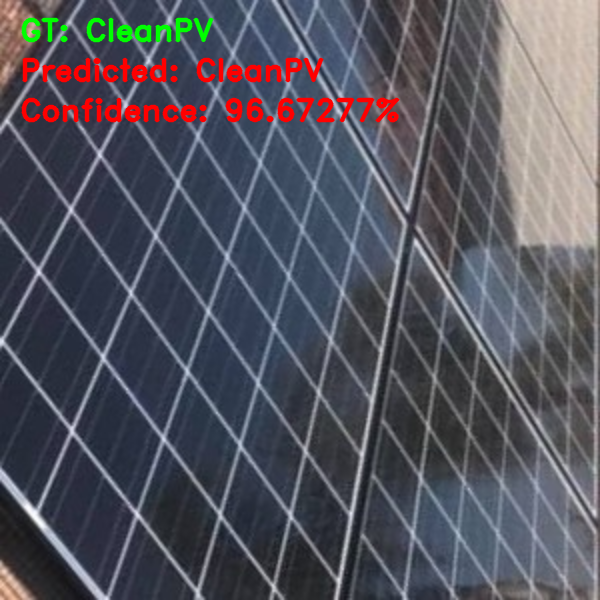

[Info] Predicted: DirtyPV, Confidence: 95.32012%


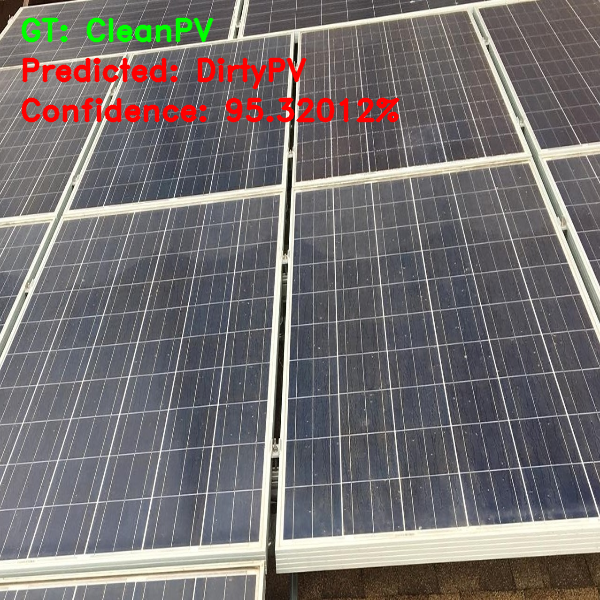

[Info] Predicted: DirtyPV, Confidence: 99.07736%


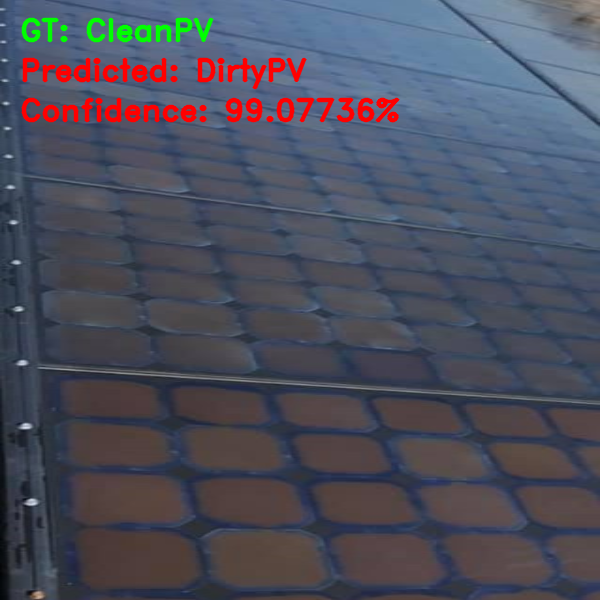

[Info] Predicted: DirtyPV, Confidence: 94.63413%


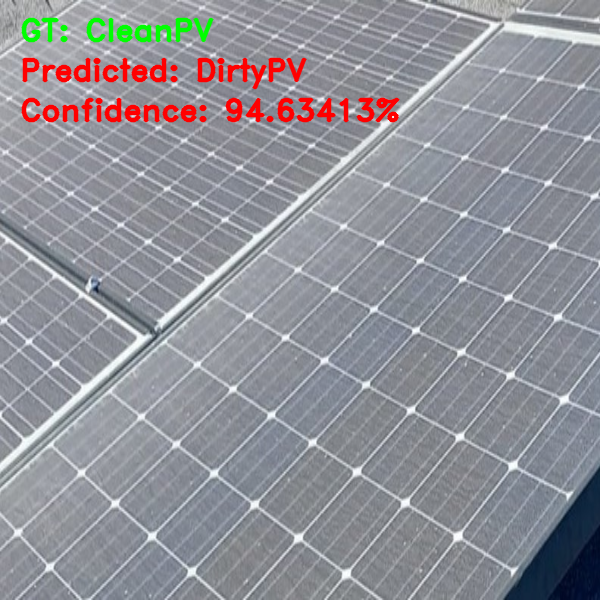

[Info] Predicted: DirtyPV, Confidence: 91.46550%


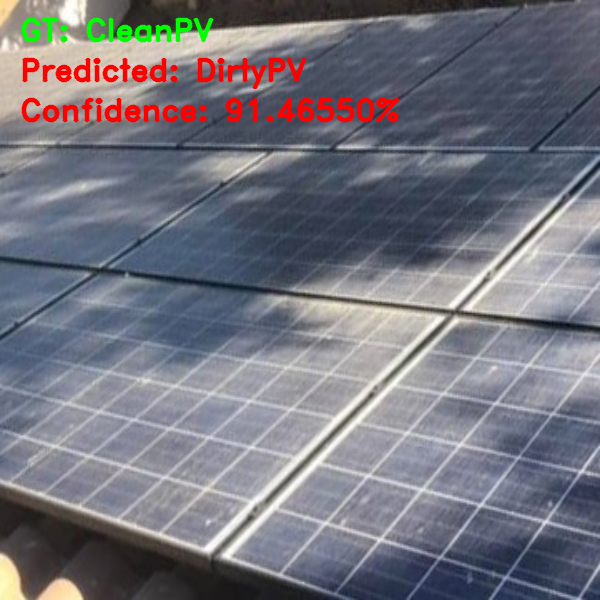

[Info] Predicted: CleanPV, Confidence: 88.71366%


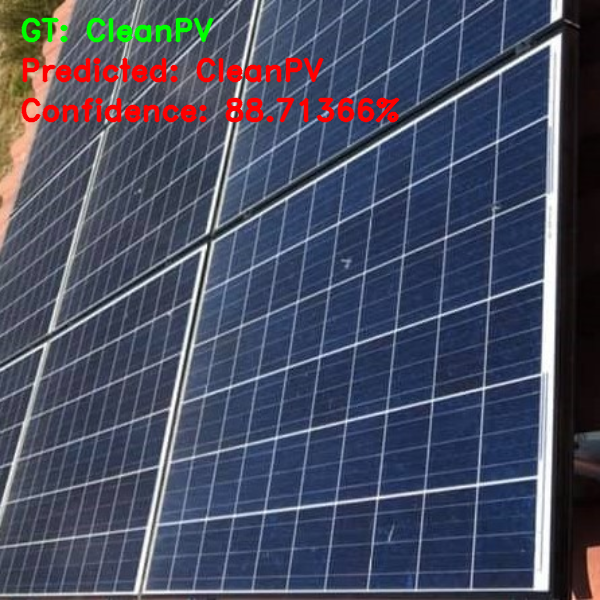

[Info] Predicted: DirtyPV, Confidence: 96.14300%


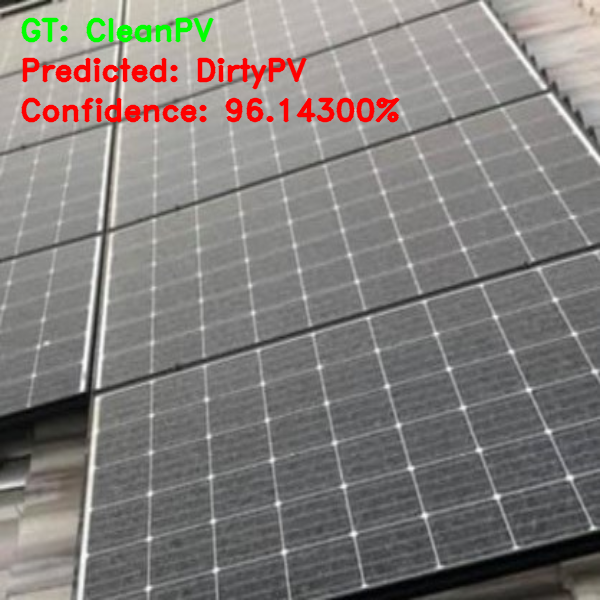

[Info] Predicted: DirtyPV, Confidence: 87.06900%


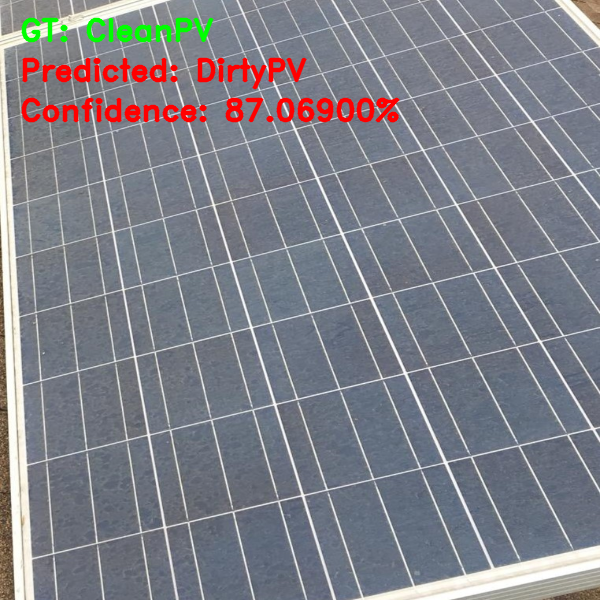

[Info] Predicted: CleanPV, Confidence: 94.84493%


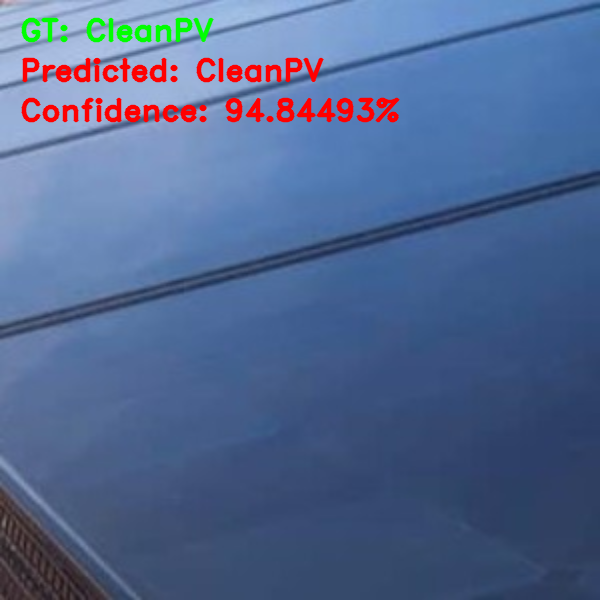

[Info] Predicted: CleanPV, Confidence: 90.36631%


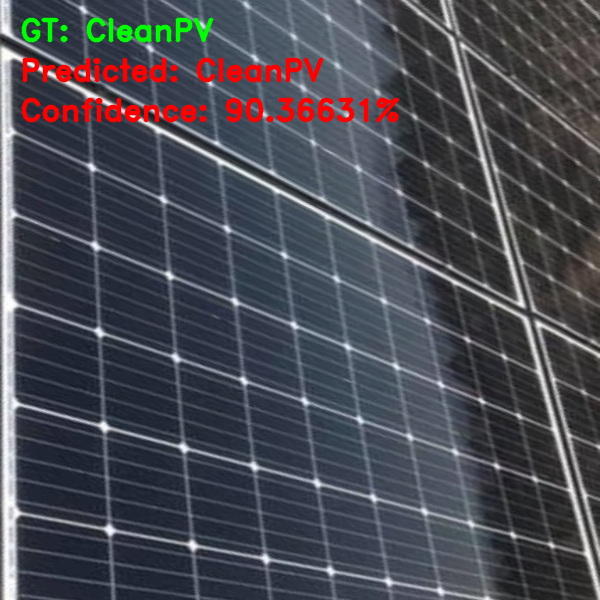

[Info] Predicted: CleanPV, Confidence: 79.35274%


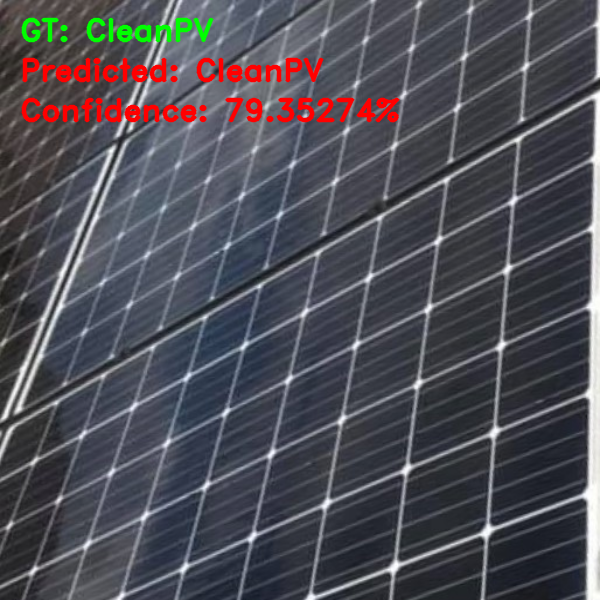

[Info] Predicted: DirtyPV, Confidence: 98.34229%


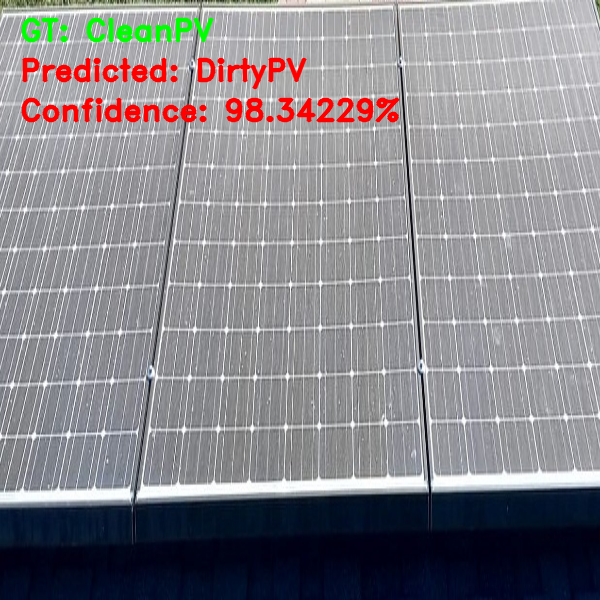

KeyboardInterrupt: ignored

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import to_categorical
import cv2
from google.colab.patches import cv2_imshow

# import required module
import glob
 
# get the path/directory
folder_dir = '/content/drive/MyDrive/DirtyAndClean-Test-2'
 
# iterate over files in
# that directory
for images in glob.iglob(f'{folder_dir}/*'):
   
    # check if the image ends with png
    if (images.endswith(".png") or images.endswith(".jpg") or images.endswith("jpeg")):
      
      img_width, img_height = 224, 224

   
      gt_class_name = (img.split('-')[2].split('/')[1])
      

      # load the trained model
      model = load_model('/content/solar_classify_finetune_final.h5')

      # load the class label dictionary
      class_dictionary = np.load('/content/class_indices.npy', allow_pickle=True).item()

      # load the image and resize it to the size required by our model
      image_orig = load_img(images, target_size=(img_width, img_height), interpolation='lanczos')
      image = img_to_array(image_orig)

      # important! otherwise the predictions will be '0'
      image = image / 255.0

      # add a new axis to make the image array confirm with
      # the (samples, height, width, depth) structure
      image = np.expand_dims(image, axis=0)

      # get the probabilities for the prediction
      probabilities = model.predict(image)

      # decode the prediction
      prediction_probability = probabilities[0, probabilities.argmax(axis=1)][0]
      class_predicted = np.argmax(probabilities, axis=1)
      inID = class_predicted[0]

      # invert the class dictionary in order to get the label for the id
      inv_map = {v: k for k, v in class_dictionary.items()}
      label = inv_map[inID]

      print("[Info] Predicted: {}, Confidence: {:.5f}%".format(label, prediction_probability*100))

      # display the image and the prediction using OpenCV
      image_cv = cv2.imread(images)
      image_cv = cv2.resize(image_cv, (600, 600), interpolation=cv2.INTER_LINEAR)

      cv2.putText(image_cv, 
            "GT: {}".format(gt_class_name), 
            (20, 40), cv2.FONT_HERSHEY_DUPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)

      cv2.putText(image_cv, 
                  "Predicted: {}".format(label), 
                  (20, 80), cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)
      cv2.putText(image_cv, 
                  "Confidence: {:.5f}%".format(prediction_probability*100), 
                  (20, 120), cv2.FONT_HERSHEY_DUPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)

      cv2_imshow(image_cv)
      #cv2.imshow("Prediction", image_cv)
      #cv2.waitKey(0)

      #cv2.destroyAllWindows()

In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Dropout, Flatten, Dense, GlobalAveragePooling2D, Input
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras import optimizers
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt
import math
import os
import os.path
import time
img_width = 224
img_height = 224
model = load_model('/content/solar_classify_finetune_final.h5')

In [ ]:
batch_size = 16

In [ ]:
test_dir = '/content/drive/MyDrive/TestSet'
test_datagen = ImageDataGenerator(rescale=1. / 255)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')


Found 53 images belonging to 2 classes.


In [ ]:

nb_test_samples = len(test_generator.filenames)
test_steps = int(math.ceil(nb_test_samples / batch_size))
pred = model.predict(test_generator, steps=test_steps, verbose=1)
predicted_class_indices=np.argmax(pred,axis=1)
labels = (test_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = [labels[k] for k in predicted_class_indices]


4/4 [==============================] - 16s 5s/step


In [ ]:

from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, classification_report

In [ ]:
print('Confusion Matrix')
print(confusion_matrix(test_generator.classes, predicted_class_indices))

Confusion Matrix
[[ 8 18]
 [ 8 19]]


In [ ]:

report = classification_report(test_generator.classes, predicted_class_indices,
                               target_names=['CleanPV','DirtyPV'])
print(report)


              precision    recall  f1-score   support

     CleanPV       0.50      0.31      0.38        26
     DirtyPV       0.51      0.70      0.59        27

    accuracy                           0.51        53
   macro avg       0.51      0.51      0.49        53
weighted avg       0.51      0.51      0.49        53

